In [1]:
include("jupyter.jl")
arrow2!(z, dz; kwargs...) = arrows2d!([z[1]], [z[2]], [dz[1]], [dz[2]], align=:center, normalize=true, shaftlength=0, taillength=0; kwargs...)
using Clustering, Dierckx, Distances
Δ, μ′ = 0.25, μ
nothing

┌ Warning: read type ODEFunction has a different number of parameters from type ODEFunction in workspace; reconstructing
└ @ JLD2 /Users/complexity/.julia/packages/JLD2/WDhXU/src/data/reconstructing_datatypes.jl:557
┌ Warning: some parameters could not be resolved for type OrdinaryDiffEqCore.InterpolationData{JLD2.ReconstructedStatic{Symbol("ODEFunction{true,SciMLBase.AutoSpecialize,FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Tuple{Vector{Float64}, Matrix{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Tuple{Vector{Float64}, Matrix{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 

In [2]:
individuals = load("data/individuals.jld2")
evolution, mcmc = individuals["evolution"], individuals["mcmc"]

(Individual[Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [-1.0 -1.0 … 1.0 1.0; 0.0 -1.0 … 0.0 0.0; … ; 0.0 1.0 … 1.0 1.0; 1.0 0.0 … -1.0 0.0], -0.08401283505705358), Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [0.0 0.0 … -1.0 -1.0; 0.0 1.0 … 0.0 0.0; … ; -1.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 -1.0], -0.09791387101172941), Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [0.0 1.0 … 0.0 -1.0; 0.0 0.0 … -1.0 0.0; … ; -1.0 1.0 … 0.0 1.0; 0.0 0.0 … 0.0 0.0], -0.07227278561061036), Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [-1.0 1.0 … -1.0 0.0; -1.0 1.0 … -1.0 0.0; … ; 0.0 -1.0 … 0.0 1.0; 1.0 1.0 … 0.0 0.0], -0.07650544173949636), Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0

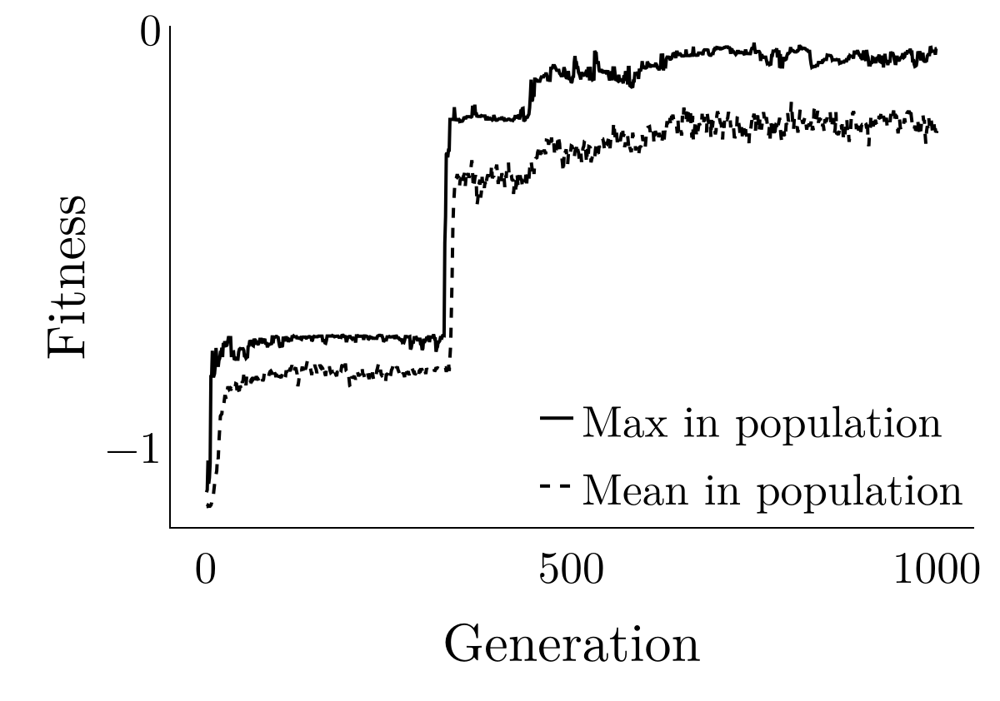

In [3]:
fitness = load("data/fitness.jld2", "d")
f, ax = plot(
    xlabel="Generation", ylabel="Fitness", yticks=[-1, 0])
lines!(dropdims(maximum(fitness, dims=1), dims=1), color=:black, label="Max in population")
lines!(dropdims(mean(fitness, dims=1), dims=1), color=:black, linestyle=:dash, label="Mean in population")
ylims!(-1.2, 0)
axislegend(ax, position=:rb, labelsize=4 / 3 * 10 * 2)
# save("fig1a.pdf", f)
f

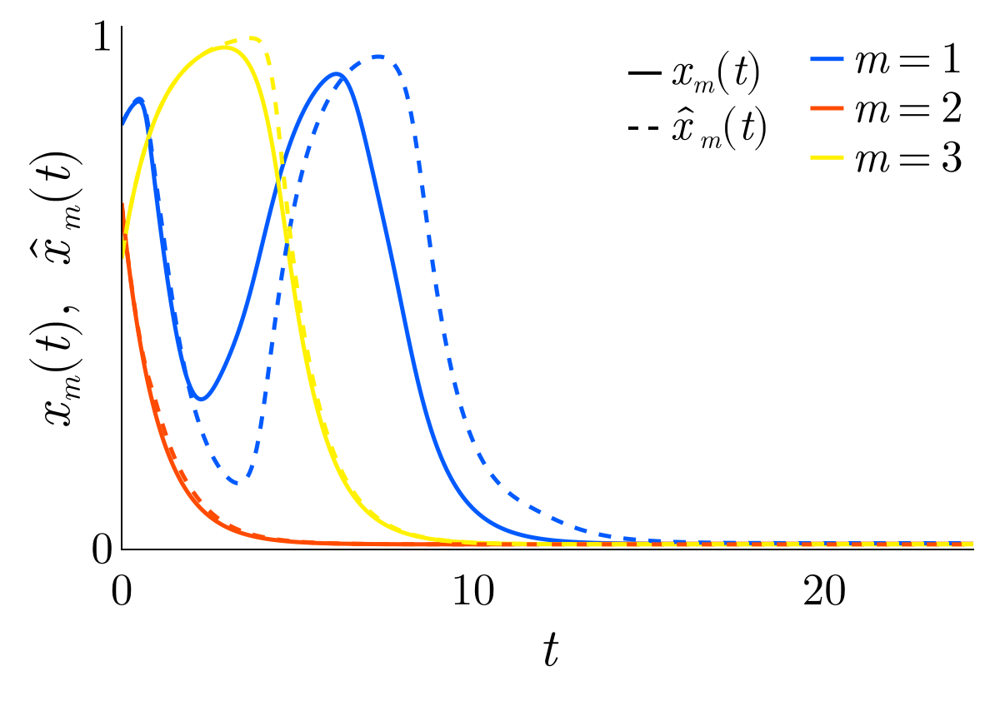

In [4]:
individual = evolution[1]
original = sol_individual(individual, x0, η, t)
f, ax = plot(
    xlabel=L"$t$", ylabel=L"$x_m (t)$,  $\hat{x}_m(t)$", limits=(extrema(t̂)..., -0.01, 1.01), xticks=[0, 10, 20], yticks=[0, 1])

foreach(i -> lines!(ax, t̂, original[i, :], linewidth=2.5, color=ucolors[i], label=L"$m = %$i$"), 1:M)
foreach(i -> lines!(ax, t̂, x̂[i, :], linewidth=2.5, linestyle=:dash, color=ucolors[i]), 1:M)
axislegend(ax, position=(1.0, 1.0), labelsize=4 / 3 * 10 * 2)
sc1 = lines!(0, 0, color=:black)
sc2 = lines!(0, 0, color=:black, linestyle=:dash)
axislegend(ax, [sc1, sc2], [L"$x_m(t)$", L"$\hat{x}_m(t)$"], position=(0.72, 0.97), labelsize=4 / 3 * 10 * 2)
# save("fig2b.pdf", f)
f

In [6]:
distance_evolution1 = load("data/distance_evolution1.jld2")
distance_evolution = load("data/distance_evolution.jld2")
distance_mcmc1 = load("data/distance_mcmc1.jld2")
distance_mcmc = load("data/distance_mcmc.jld2")

Dict{String, Any} with 2 entries:
  "environment" => [0.0789519, 0.0639322, 0.0895021, 0.0311015, 0.0648176, 0.10…
  "genetic"     => [0.164849, 0.158637, 0.210582, 0.0813433, 0.131139, 0.190485…

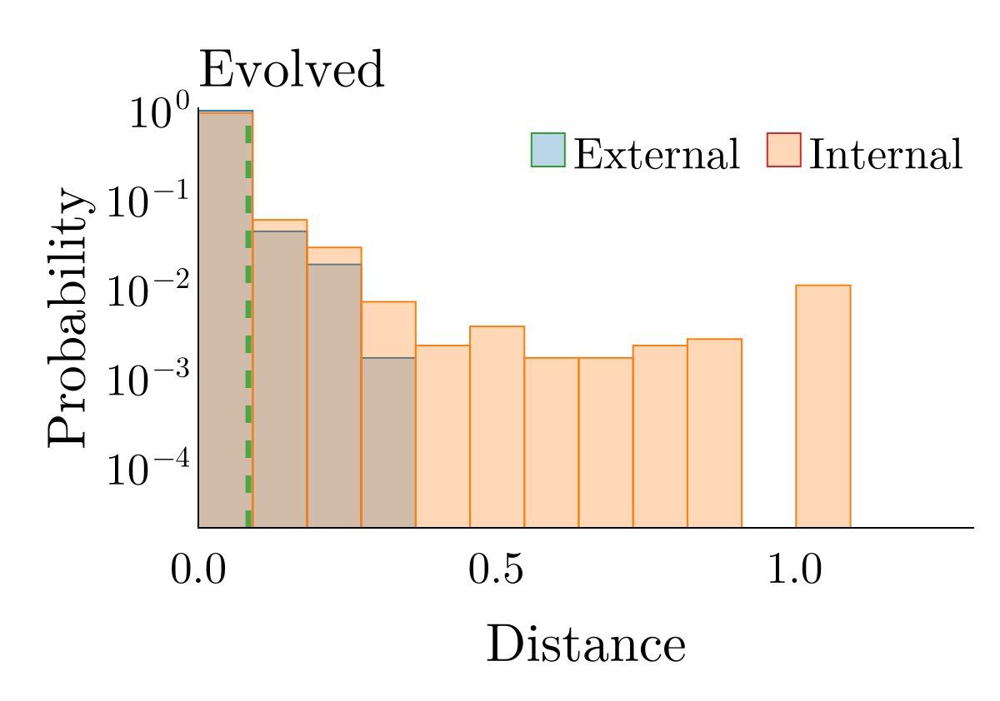

In [7]:
f, ax = plot(
    yscale=log10, xlabel="Distance", ylabel="Probability",
    title="Evolved", titlealign=:left, titlesize=4 / 3 * 12 * 2, titlefont=:regular)
h = distance_evolution1["environment"]
barplot!(h.edges[1][1:end-1] .+ step(h.edges[1]) / 2, h.weights / sum(h.weights),
    color=(tab10[1], 0.3), strokecolor=tab10[1], gap=0, strokewidth=1, fillto=1e-1 / 5000)
h = distance_evolution1["genetic"]
barplot!(h.edges[1][1:end-1] .+ step(h.edges[1]) / 2, h.weights / sum(h.weights),
    color=(tab10[2], 0.3), strokecolor=tab10[2], gap=0, strokewidth=1, fillto=1e-1 / 5000)
vlines!(-evolution[1].fitness, color=(tab10[3], 0.8), linewidth=3.5, linestyle=:dash)
limits!(0, 1.3, 1e-1 / 5000, 1)
barplot!([0], [0], color=(tab10[1], 0.3), strokecolor=tab10[3], gap=0, strokewidth=1, fillto=1e-1 / 5000, label="External")
barplot!([0], [0], color=(tab10[2], 0.3), strokecolor=tab10[4], gap=0, strokewidth=1, fillto=1e-1 / 5000, label="Internal")
axislegend(ax, position=:rt, labelsize=4 / 3 * 10 * 2, orientation=:horizontal)
# save("fig4a.pdf", f)
f

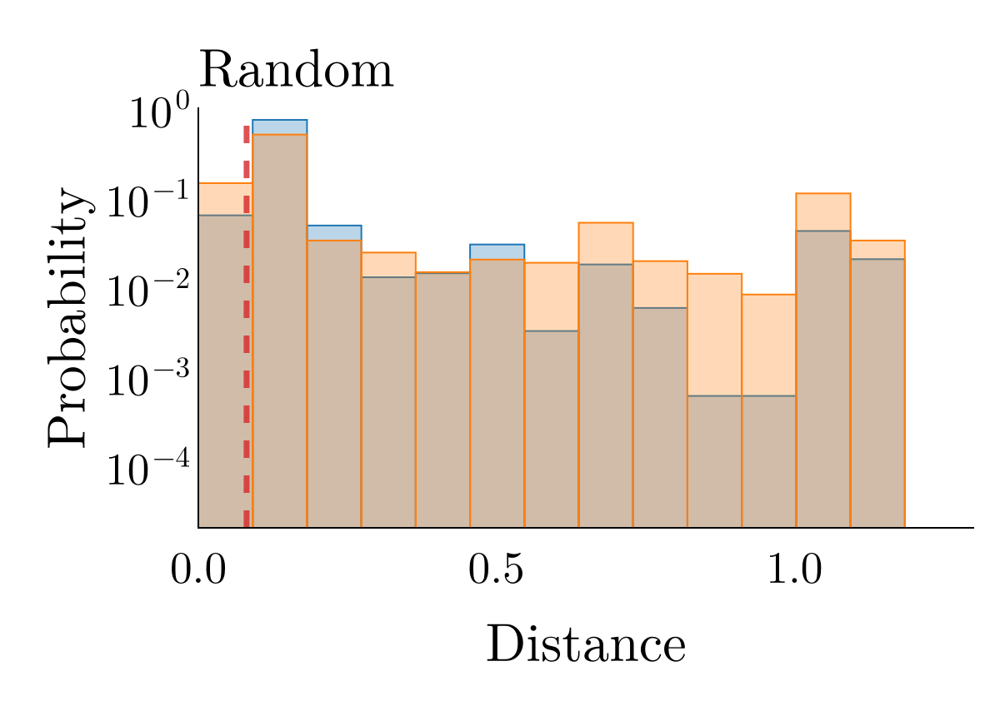

In [8]:
f, ax = plot(
    yscale=log10, xlabel="Distance", ylabel="Probability",
    title="Random", titlealign=:left, titlesize=4 / 3 * 12 * 2, titlefont=:regular)
h = distance_mcmc1["environment"]
barplot!(h.edges[1][1:end-1] .+ step(h.edges[1]) / 2, h.weights / sum(h.weights),
    color=(tab10[1], 0.3), strokecolor=tab10[1], gap=0, strokewidth=1, fillto=1e-1 / 5000)
h = distance_mcmc1["genetic"]
barplot!(h.edges[1][1:end-1] .+ step(h.edges[1]) / 2, h.weights / sum(h.weights),
    color=(tab10[2], 0.3), strokecolor=tab10[2], gap=0, strokewidth=1, fillto=1e-1 / 5000)
vlines!(-mcmc[1].fitness, color=(tab10[4], 0.8), linewidth=3.5, linestyle=:dash)
limits!(0, 1.3, 1e-1 / 5000, 1)
# save("fig4b.pdf", f)
f

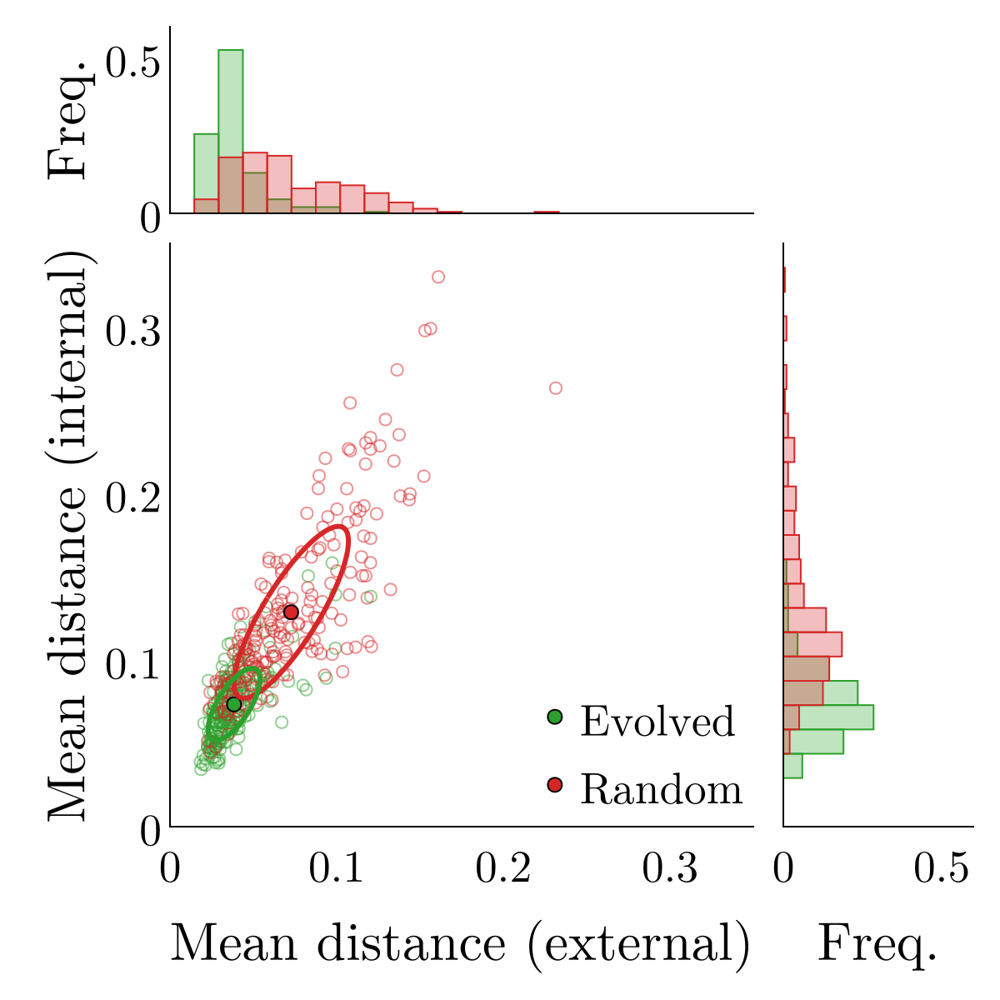

In [9]:
xlims, ylims, zlims = (0., 0.35), (0., 0.35), (0.0, 0.6)
xticks, yticks, zticks = ([0.0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]), ([0.0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]), ([0.0, 0.5], ["0", "0.5"])
bins = range(xlims..., length=25)

f = Figure(size=(450 * 4 / 3, 450 * 4 / 3))
ax1 = Axis(f[1, 1], ylabel="Freq.", xticklabelsvisible=false, yticks=zticks)
hist!(ax1, distance_evolution["environment"], bins=bins, gap=0, strokewidth=1, color=(tab10[3], 0.3), strokecolor=tab10[3], normalization=:probability)
hist!(ax1, distance_mcmc["environment"], bins=bins, gap=0, strokewidth=1, color=(tab10[4], 0.3), strokecolor=tab10[4], normalization=:probability)
xlims!(ax1, xlims...), ylims!(ax1, zlims...)

ax3 = Axis(f[2, 1], aspect=AxisAspect(1), xlabel="Mean distance (external)", ylabel="Mean distance (internal)",
    xticks=xticks, yticks=yticks)
scatter!(ax3, distance_evolution["environment"], distance_evolution["genetic"],
    markersize=10, color=(tab10[3], 0.0), strokewidth=1.0, strokecolor=(tab10[3], 0.5))
scatter!(ax3, distance_mcmc["environment"], distance_mcmc["genetic"],
    markersize=10, color=(tab10[4], 0.0), strokewidth=1.0, strokecolor=(tab10[4], 0.5))
xlims!(ax3, xlims...), ylims!(ax3, ylims...)

scatter!(mean(distance_evolution["environment"]), mean(distance_evolution["genetic"]), markersize=12, color=tab10[3], strokewidth=1, label="Evolved")
scatter!(mean(distance_mcmc["environment"]), mean(distance_mcmc["genetic"]), markersize=12, color=tab10[4], strokewidth=1, label="Random")
lines!(ax3, covariance_ellipse(distance_mcmc["environment"], distance_mcmc["genetic"])..., color=tab10[4], linewidth=3)
lines!(ax3, covariance_ellipse(distance_evolution["environment"], distance_evolution["genetic"])..., color=tab10[3], linewidth=3)
axislegend(ax3, position=:rb, labelsize=4 / 3 * 10 * 2)

ax4 = Axis(f[2, 2], xlabel="Freq.", xticks=zticks, yticklabelsvisible=false, xlabelsize=4 / 3 * 12 * 2)
hist!(ax4, distance_evolution["genetic"], bins=bins, gap=0, strokewidth=1, color=(tab10[3], 0.3), strokecolor=tab10[3], direction=:x, normalization=:probability)
hist!(ax4, distance_mcmc["genetic"], bins=bins, gap=0, strokewidth=1, color=(tab10[4], 0.3), strokecolor=tab10[4], direction=:x, normalization=:probability)
xlims!(ax4, zlims...), ylims!(ax4, ylims...)

rowsize!(f.layout, 2, 350)
colsize!(f.layout, 1, 350)

# save("fig4c.pdf", f)

f

In [ ]:
Random.seed!(1234)
Δ = 0.25
t′s = range(t[1], t[2], 50)
μ′ = 2

2

In [63]:
individual = evolution[1]
original = sol_individual(individual, x0, η, t)

environment = reduce(vcat, [environmental_copies(individual, t′, Δ, 100) for t′ in t′s])
genetic = mutational_copies(individual, μ′, 5000)

filter!(sol -> distance_t(original[1:M, :], sol[1:M, :]) > 0.15, environment)
filter!(sol -> distance_t(original[1:M, :], sol[1:M, :]) > 0.15, genetic)

403-element Vector{ODESolution}:
 ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{Float64}}}, Nothing, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Tuple{Vec

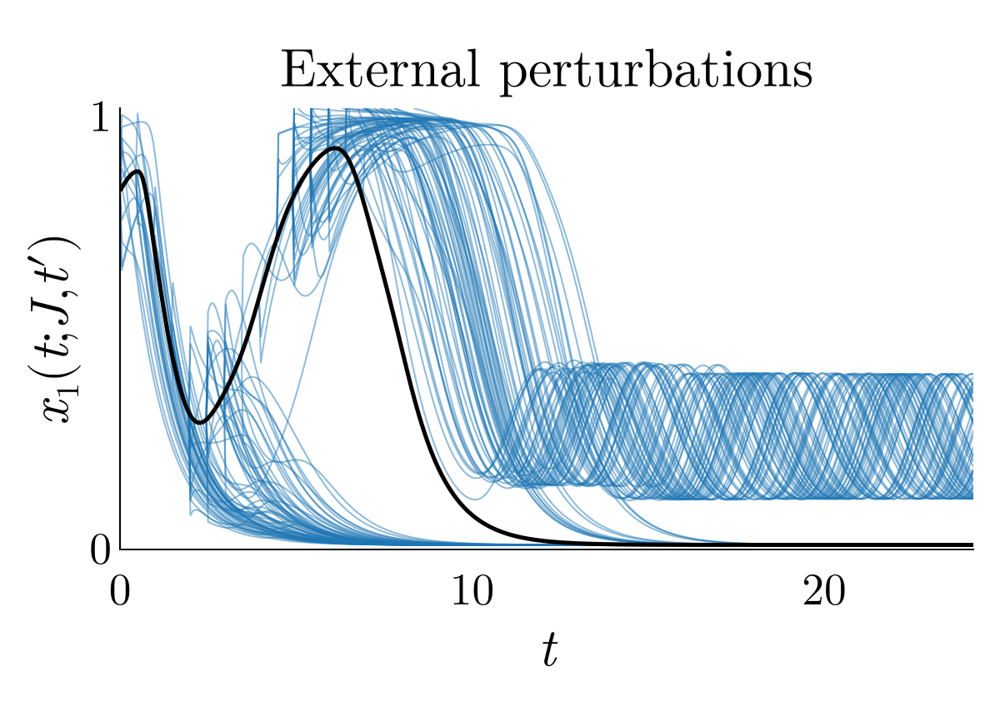

In [64]:
f, ax = plot(
    xlabel=L"$t$", ylabel=L"$x_1 (t; J, t\prime)$", xticks=[0, 10, 20], yticks=[0, 1],
    title="External perturbations", titlesize=4 / 3 * 12 * 2, titlefont=:regular)

for sol in environment
    lines!(t̂, sol[1, :], linewidth=1, alpha=0.5, color=tab10[1])
end
lines!(t̂, original[1, :], linewidth=2.5, color=:black)
xlims!(extrema(t̂)...), ylims!(-0.01, 1.01)

# save("fig5a.pdf", f)
f

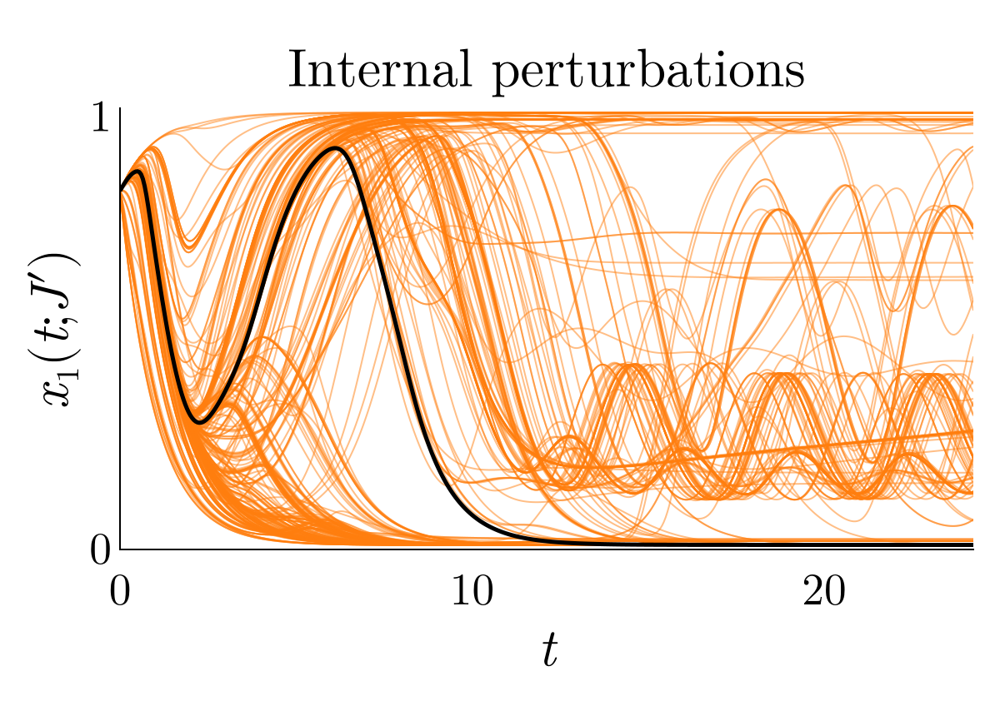

In [65]:
f, ax = plot(
    xlabel=L"$t$", ylabel=L"$x_1 (t; J\prime)$", xticks=[0, 10, 20], yticks=[0, 1],
    title="Internal perturbations", titlesize=4 / 3 * 12 * 2, titlefont=:regular)

for sol in genetic
    lines!(ax, t̂, sol[1, :], linewidth=1, alpha=0.5, color=tab10[2])
end
lines!(t̂, original[1, :], linewidth=2.5, color=:black)
xlims!(extrema(t̂)...), ylims!(-0.01, 1.01)

# save("fig5b.pdf", f)
f

In [15]:
mds1 = load("data/mds1.jld2")
X̂ = mds1["X̂"]

20×1 Matrix{Float64}:
 0.3705984958003932
 ⋮
 0.010225052979137483

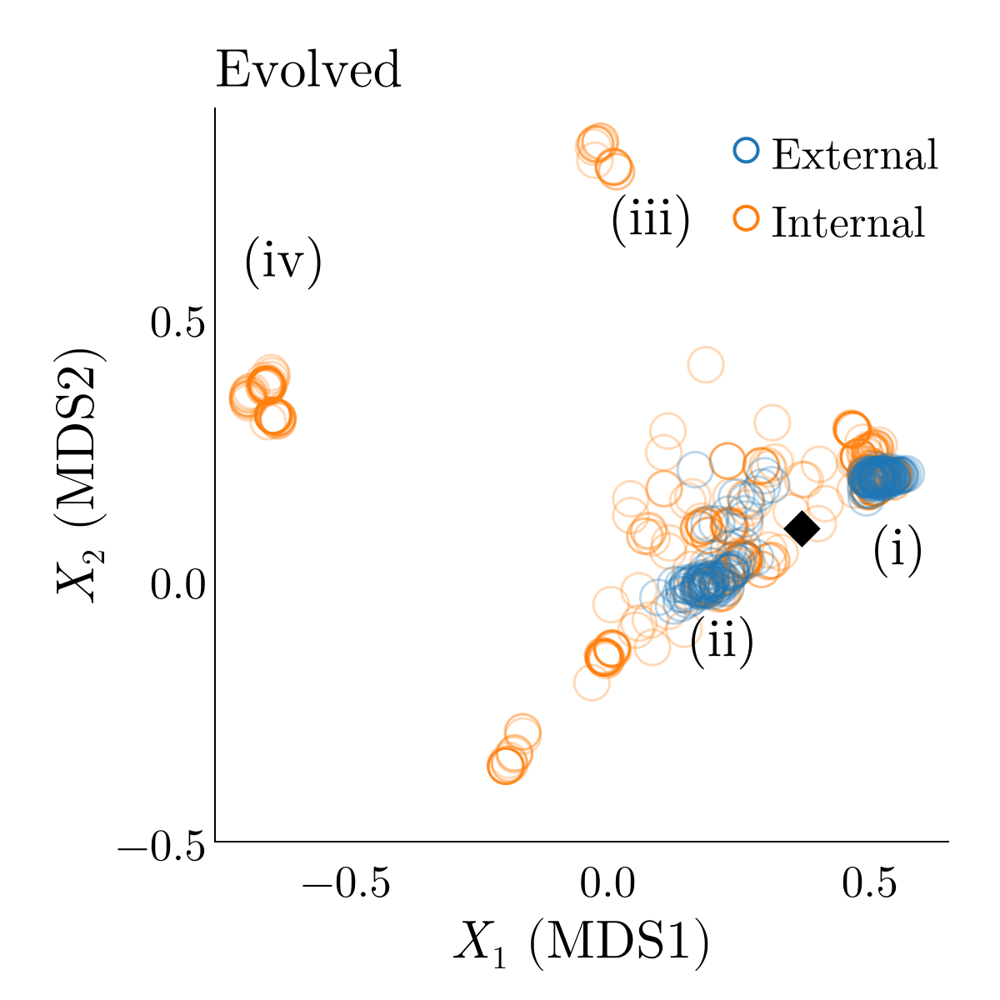

In [16]:
X, K_ = mds1["evolution"]
Xp, Xg = X[:, 1:K_], X[:, K_+1:end]

f, ax = plot(aspect=:equal,
    xlabel=L"$X_1$ (MDS1)", ylabel=L"$X_2$ (MDS2)",
    title="Evolved", titlesize=4 / 3 * 12 * 2, titlealign=:left, titlefont=:regular)
scatter!(Xg[1, :], Xg[2, :], color=:transparent, markersize=30, strokewidth=1.5, strokecolor=(tab10[2], 0.3))
scatter!(Xp[1, :], Xp[2, :], color=:transparent, markersize=30, strokewidth=1.5, strokecolor=(tab10[1], 0.3))
scatter!(X̂[1, :], X̂[2, :], color=:black, markersize=25, marker=:diamond)
scatter!(-2, -2, color=:transparent, markersize=20, strokewidth=2., strokecolor=tab10[1], label="External")
scatter!(-2, -2, color=:transparent, markersize=20, strokewidth=2., strokecolor=tab10[2], label="Internal")
axislegend(ax, position=:rt, labelsize=4 / 3 * 10 * 2)
text!(0.5, 0.0, text="(i)", fontsize=4 / 3 * 12 * 2)
text!(0.15, -0.175, text="(ii)", fontsize=4 / 3 * 12 * 2)
text!(0.0, 0.63, text="(iii)", fontsize=4 / 3 * 12 * 2)
text!(-0.7, 0.55, text="(iv)", fontsize=4 / 3 * 12 * 2)
xlims!(-0.75, 0.65), ylims!(-0.5, 0.9)
# save("fig5c.pdf", f)
f

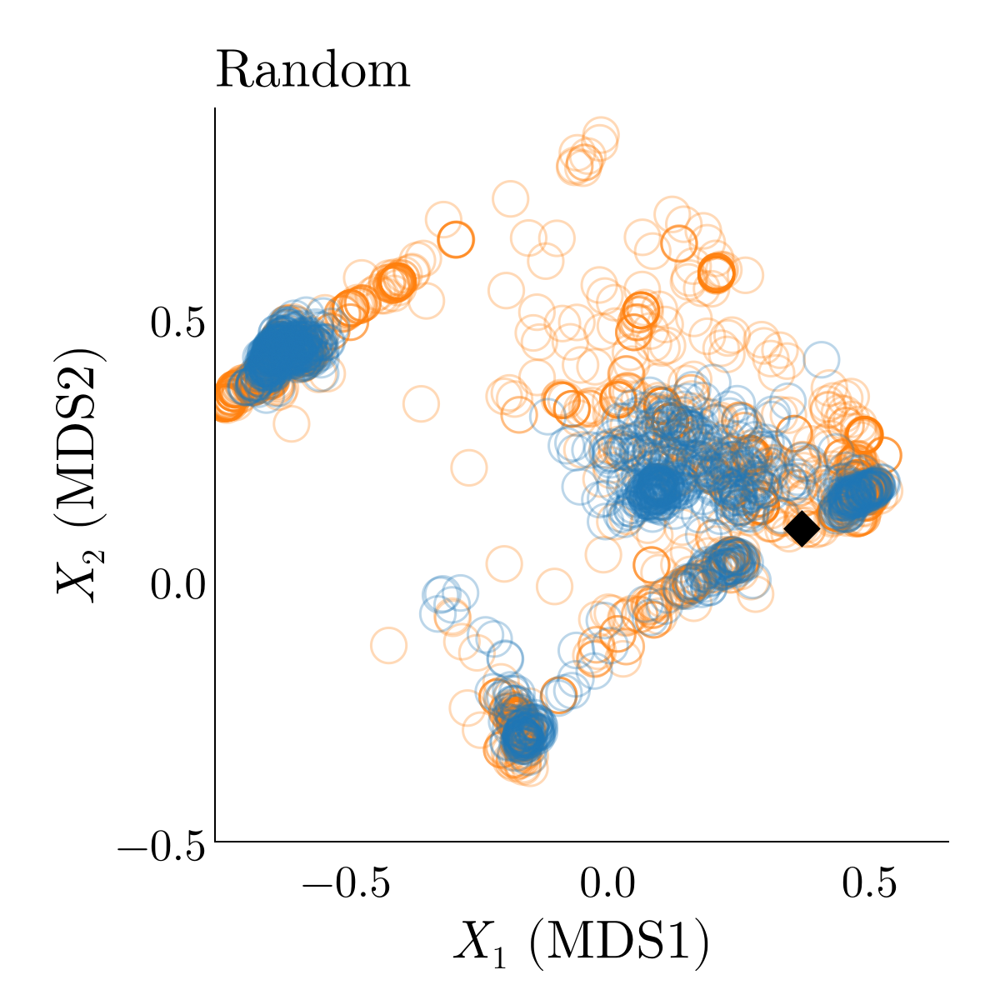

In [17]:
X, K_ = mds1["mcmc"]
Xp, Xg = X[:, 1:K_], X[:, K_+1:end]

f, ax = plot(aspect=:equal,
    xlabel=L"$X_1$ (MDS1)", ylabel=L"$X_2$ (MDS2)",
    title="Random", titlesize=4 / 3 * 12 * 2, titlealign=:left, titlefont=:regular)
scatter!(Xg[1, :], Xg[2, :], color=:transparent, markersize=30, strokewidth=1.5, strokecolor=(tab10[2], 0.3))
scatter!(Xp[1, :], Xp[2, :], color=:transparent, markersize=30, strokewidth=1.5, strokecolor=(tab10[1], 0.3))
scatter!(X̂[1, :], X̂[2, :], color=:black, markersize=25, marker=:diamond)
xlims!(-0.75, 0.65), ylims!(-0.5, 0.9)
# save("fig5d.pdf", f)
f

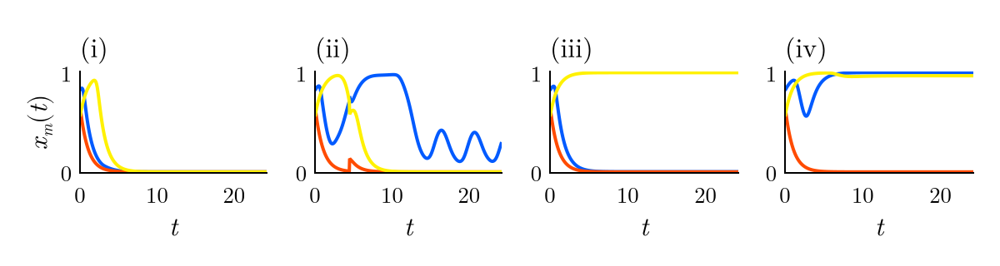

In [19]:
f = Figure(size=(450 * 4 / 3, 120 * 4 / 3))

title_s = ["(i)", "(ii)", "(iii)", "(iv)"]
ax_s = [Axis(f[1, k], title=title_s[k], titlealign=:left, titlefont=:regular, titlesize=12 * 4 / 3,
    xlabelsize=12 * 4 / 3, ylabelsize=12 * 4 / 3,
    xticklabelsize=10 * 4 / 3, yticklabelsize=10 * 4 / 3,
    xticks=[0, 10, 20], yticks=[0, 1], ylabel=k == 1 ? L"$x_m (t)$" : "", xlabel=L"$t$")
        for k in 1:4]
# ax_s = [Axis(f[i, j],
#         title=title_s[(i-1)*2+j], titlealign=:left, titlefont=:regular, titlesize=12 * 4 / 3,
#         xlabelsize=12 * 4 / 3,ylabelsize=12 * 4 / 3,
#         xticklabelsize=10 * 4 / 3, yticklabelsize=10 * 4 / 3,
#         xticks=[0, 10, 20], yticks=[0, 1],
#         xlabel=(i == 2) ? L"$t$" : "", ylabel=(j == 1) ? L"$x_m (t)$" : "",)
#     for i in 1:2, j in 1:2]
tr_s = [mds1["tr$(k)"] for k in 1:4]

for (ax, tr) in zip(ax_s, tr_s)
    foreach(i -> lines!(ax, tr.t, tr[i, :], linewidth=2, color=ucolors[i]), 1:M)
    xlims!(ax, extrema(tr.t)...), ylims!(ax, -0.01, 1.01)
end
# save("fig5e.pdf", f)
f

In [21]:
mds_distribution2_evolution = load("data/mds_distribution2_evolution.jld2")
mds_distribution2_mcmc = load("data/mds_distribution2_mcmc.jld2")

Dict{String, Any} with 3 entries:
  "env_genet"   => [0.00339356, 0.0208581, 0.00890003, 0.00300789, 0.000768122,…
  "environment" => [0.0253933, 0.0251005, 0.0360539, 0.0452806, 0.00445534, 0.0…
  "genetic"     => [0.0105595, 0.0331431, 0.020665, 0.0123954, 0.00779225, 0.01…

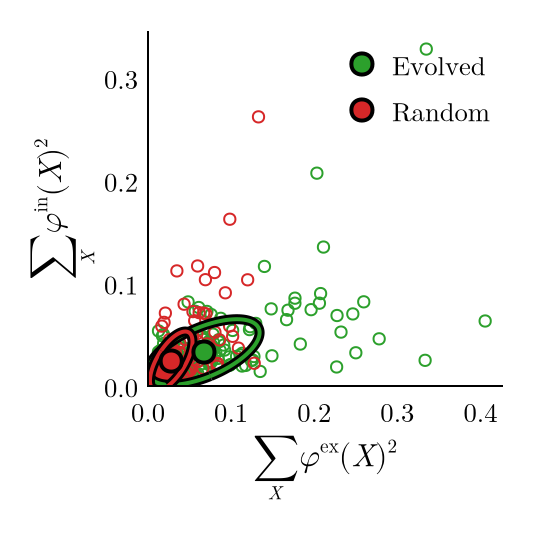

In [22]:
x, xlabel = "environment", L"$\sum_X \varphi^{\mathrm{ex}}(X)^2$"
y, ylabel = "genetic", L"$\sum_X \varphi^{\mathrm{in}}(X)^2$"

f, ax = plot(size=(200 * 4 / 3, 200 * 4 / 3), aspect=:equal,
    xlabelsize=12 * 4 / 3, ylabelsize=12 * 4 / 3,
    xticklabelsize=10 * 4 / 3, yticklabelsize=10 * 4 / 3,
    xlabel=xlabel, ylabel=ylabel,)


# xticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]), yticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]))

scatter!(mds_distribution2_evolution[x], mds_distribution2_evolution[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[3])
scatter!(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[4])

lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=tab10[3], linewidth=2)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=tab10[4], linewidth=2)

scatter!(mean(mds_distribution2_evolution[x]), mean(mds_distribution2_evolution[y]), markersize=15, color=tab10[3], strokewidth=2, label="Evolved")
scatter!(mean(mds_distribution2_mcmc[x]), mean(mds_distribution2_mcmc[y]), markersize=15, color=tab10[4], strokewidth=2, label="Random")

axislegend(labelsize=10 * 4 / 3)
xlims!(low=0)
ylims!(low=0)
# save("fig5f.pdf", f)
f

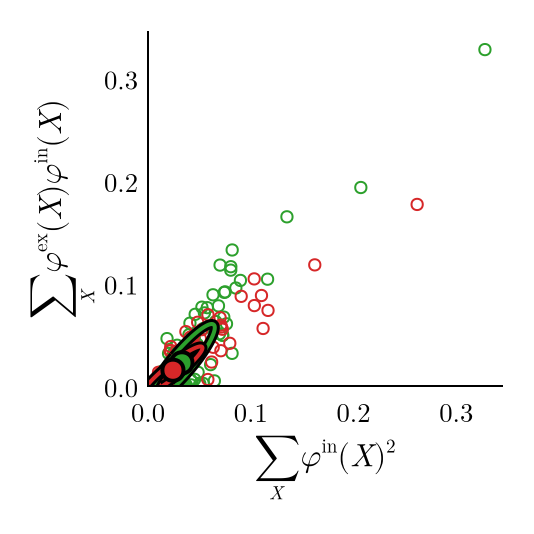

In [23]:
x, xlabel = "genetic", L"$\sum_X \varphi^{\mathrm{in}}(X)^2$"
y, ylabel = "env_genet", L"$\sum_X \varphi^{\mathrm{ex}}(X) \varphi^{\mathrm{in}}(X)$"

f, ax = plot(size=(200 * 4 / 3, 200 * 4 / 3), aspect=:equal,
    xlabelsize=12 * 4 / 3, ylabelsize=12 * 4 / 3,
    xticklabelsize=10 * 4 / 3, yticklabelsize=10 * 4 / 3,
    xlabel=xlabel, ylabel=ylabel,)
# xlabel=xlabel, ylabel=ylabel,
# xticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]), yticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]))

scatter!(mds_distribution2_evolution[x], mds_distribution2_evolution[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[3])
scatter!(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[4])

lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=tab10[3], linewidth=2)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=tab10[4], linewidth=2)

scatter!(mean(mds_distribution2_evolution[x]), mean(mds_distribution2_evolution[y]), markersize=15, color=tab10[3], strokewidth=2, label="Evolved")
scatter!(mean(mds_distribution2_mcmc[x]), mean(mds_distribution2_mcmc[y]), markersize=15, color=tab10[4], strokewidth=2, label="Random")


xlims!(low=0)
ylims!(low=0)
# save("fig5g.pdf", f)
f

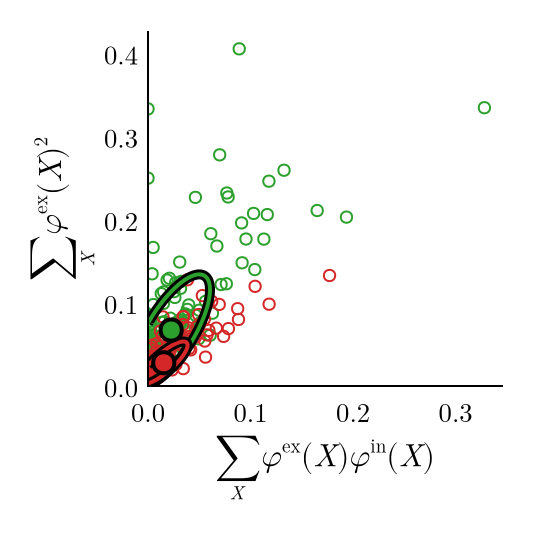

In [24]:
x, xlabel = "env_genet", L"$\sum_X \varphi^{\mathrm{ex}}(X) \varphi^{\mathrm{in}}(X)$"
y, ylabel = "environment", L"$\sum_X \varphi^{\mathrm{ex}}(X)^2$"

f, ax = plot(size=(200 * 4 / 3, 200 * 4 / 3), aspect=:equal,
    xlabelsize=12 * 4 / 3, ylabelsize=12 * 4 / 3,
    xticklabelsize=10 * 4 / 3, yticklabelsize=10 * 4 / 3,
    xlabel=xlabel, ylabel=ylabel,)
# xticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]), yticks=([0, 0.1, 0.2, 0.3], ["0", "0.1", "0.2", "0.3"]))

scatter!(mds_distribution2_evolution[x], mds_distribution2_evolution[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[3])
scatter!(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y], markersize=8, color=:transparent, strokewidth=1.0, strokecolor=tab10[4])

lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_evolution[x], mds_distribution2_evolution[y])..., color=tab10[3], linewidth=2)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=:black, linewidth=5)
lines!(covariance_ellipse(mds_distribution2_mcmc[x], mds_distribution2_mcmc[y])..., color=tab10[4], linewidth=2)

scatter!(mean(mds_distribution2_evolution[x]), mean(mds_distribution2_evolution[y]), markersize=15, color=tab10[3], strokewidth=2, label="Evolved")
scatter!(mean(mds_distribution2_mcmc[x]), mean(mds_distribution2_mcmc[y]), markersize=15, color=tab10[4], strokewidth=2, label="Random")

xlims!(low=0)
ylims!(low=0)
# save("fig5h.pdf", f)
f

In [26]:

seed = 1
individual = evolution[seed]

Random.seed!(1234)
original = sol_individual(individual, x0, η, t)
phenocopies = reduce(vcat, [environmental_copies(individual, t′, Δ, 100) for t′ in range(extrema(t)..., length=50)])

mutants = [mutant(individual, μ′) for _ in 1:5000]
genocopies = Vector{ODESolution}(undef, length(mutants))
Threads.@threads for l in 1:length(mutants)
    genocopies[l] = sol_individual(mutants[l], x0, η, t)
end

In [27]:
filter!(sol -> distance_t(original[1:M, :], sol[1:M, :]) .> 0.15, phenocopies)
D = pairwise(distance_t, vec([sol[:, :] for sol in phenocopies]))
h = hclust(D)
ho = h.order

ls = cutree(h, k=3)
ls = ls[ho]

phenocopies = phenocopies[ho]

k = 3
X = reduce(hcat, [original[:, :], phenocopies[findfirst(ls .== k)][:, :]])
pca = fit(PCA, X)

poriginal = transform(pca, original[:, :])
p0 = [mean(poriginal[k, :]) for k in 1:outdim(pca)]
z1s, z2s = range(-1.5, 1.5, length=50), range(-2.8, 1, length=50)
xs = [reconstruct(pca, [z1, z2, p0[3:end]...]) for z1 in z1s, z2 in z2s]
sols = Matrix{ODESolution}(undef, size(xs))
Threads.@threads for l in 1:length(xs)
    sols[l] = sol_individual(individual, xs[l], η, t)
end

basins = zeros(Int, size(sols))
for (l, sol) in enumerate(sols)
    if (norm(original[:, end] - sol[:, end]) < 1.)
        basins[l] = 0
    else
        basins[l] = 1
    end
end
spline = Spline2D(z1s, z2s, basins; s=5.)
z1s_ = range(-1.8, 1.8, length=500)
z2s_ = range(-2.8, 1, length=500)
basins_ = [spline(z1, z2) for z1 in z1s_, z2 in z2s_]
B = map(basins -> basins < 1 / 2 ? 10 : 9, basins_)

d = Float64[]
for l in findall(ls .== k)
    sol = phenocopies[l]
    timepoint = findfirst([norm(d) for d in eachcol(original[:, :] - sol[:, :])] .> 10^(-3))
    psol = transform(pca, sol[:, :])
    push!(d, norm(psol[1:2, timepoint] - poriginal[1:2, timepoint]))
end
d = sortperm(d, rev=true)

62-element Vector{Int64}:
 35
  ⋮
 31

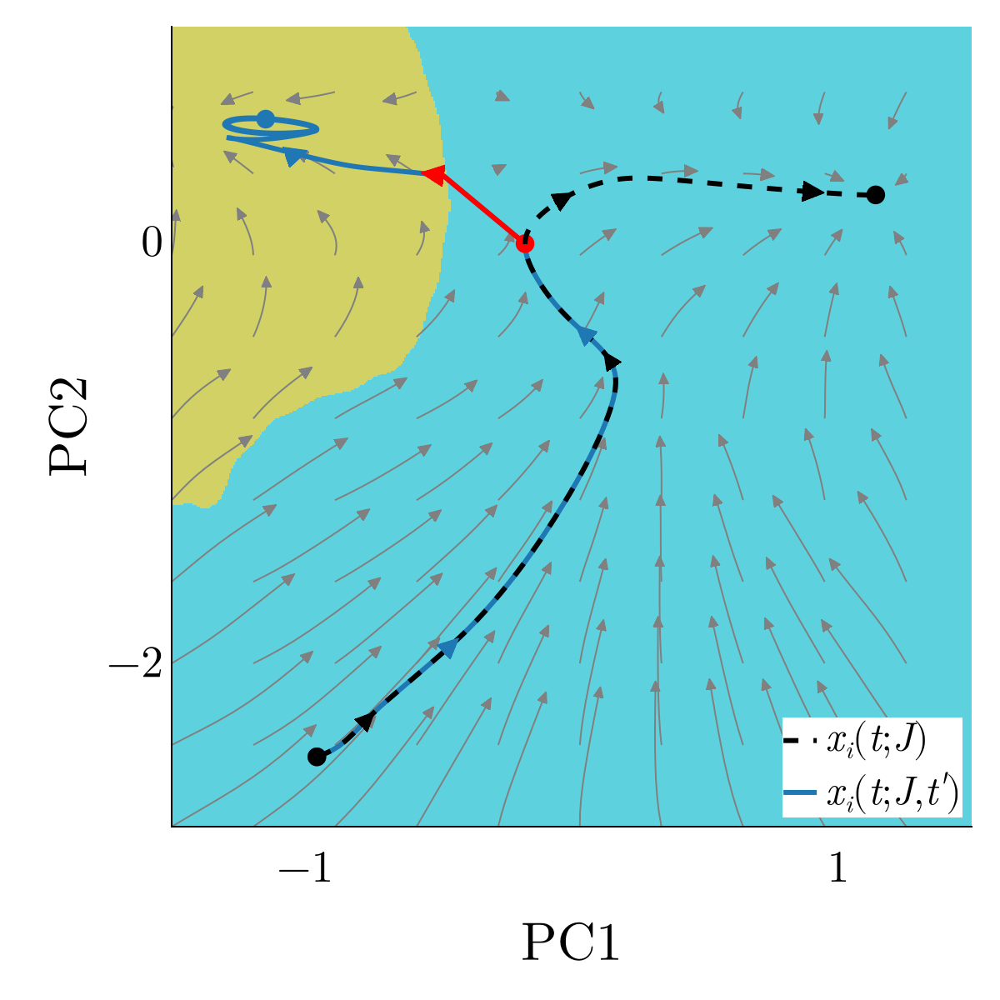

In [28]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", xticks=[-1, 1], yticks=[-2, 0],)

heatmap!(z1s_, z2s_, tab10[B], alpha=0.7)

psols = [transform(pca, sol[:, :]) for sol in sols[1:5:end, 1:5:end]]
for psol in psols
    lines!(psol[1, 1:10], psol[2, 1:10], linewidth=1, color=:gray)
    arrow2!(psol[1:2, 10], psol[1:2, 11] - psol[1:2, 10], color=:gray, tiplength=10, tipwidth=10, lengthscale=0.05,)
end

phenocopy = phenocopies[d[2]]
pphenocopy = transform(pca, phenocopy[:, :])
lines!(pphenocopy[1, :], pphenocopy[2, :], linewidth=3, color=tab10[1])
scatter!(pphenocopy[1, 1], pphenocopy[2, 1], markersize=16, color=tab10[1])
scatter!(pphenocopy[1, end], pphenocopy[2, end], markersize=16, color=tab10[1])
timepoint = findfirst([norm(d) for d in eachcol(original[:, :] - phenocopy[:, :])] .> 10^(-3))
arrow2!(pphenocopy[:, timepoint], pphenocopy[:, timepoint+1] - pphenocopy[:, timepoint], align=:tail, color=:red, tiplength=10, tipwidth=10, lengthscale=0.085)
lines!(pphenocopy[1, timepoint-1:timepoint], pphenocopy[2, timepoint-1:timepoint], linewidth=3, color=:red)
scatter!([pphenocopy[1, timepoint-1]], [pphenocopy[2, timepoint-1]], color=:red, markersize=16)


# poriginal = transform(pca, original[:, :])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3, color=:black, linestyle=:dash)
scatter!(poriginal[1, 1], poriginal[2, 1], markersize=16, color=:black)
scatter!(poriginal[1, end], poriginal[2, end], markersize=16, color=:black)
for ts in 10:60:200
    arrow2!(poriginal[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tiplength=10, tipwidth=10, lengthscale=0.08,)
end

for ts in 20:60:180
    arrow2!(pphenocopy[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tiplength=10, tipwidth=10, lengthscale=0.085, color=tab10[1])
end
xlims!(extrema(z1s)...), ylims!(extrema(z2s)...)

lines!([0], [0], linewidth=3, color=:black, linestyle=:dash, label=L"$x_i (t; J)$")
lines!([0], [0], linewidth=3, color=tab10[1], label=L"$x_i (t; J, t')$")
axislegend(position=:rb, labelsize=24, framevisible=true, framecolor=:white)

# save("fig6a.png", f)
f

In [30]:
idxs = findall([distance_t(original[1:M, :], sol[1:M, :]) for sol in genocopies] .> 0.15)
mutants = mutants[idxs]
genocopies = genocopies[idxs]
mutants = mutants[sortperm([distance_t(sol[:, :], phenocopies[findfirst(ls .== k)][:, :]) for sol in genocopies])]
mutant_ = mutants[2]
sols = Matrix{ODESolution}(undef, size(xs))
Threads.@threads for l in 1:length(xs)
    sols[l] = sol_individual(mutant_, xs[l], η, t)
end
basins = zeros(Int, size(sols))
for (l, sol) in enumerate(sols)
    if (norm(original[:, end] - sol[:, end]) < 1.)
        basins[l] = 0
    else
        basins[l] = 1
    end
end
spline = Spline2D(z1s, z2s, basins; s=5.)
z1s_ = range(-1.8, 1.8, length=500)
z2s_ = range(-2.8, 1, length=500)
basins_ = [spline(z1, z2) for z1 in z1s_, z2 in z2s_]
B_ = map(basins -> basins < 1 / 2 ? 10 : 9, basins_)

500×500 Matrix{Int64}:
 9  9  9  9  9  9  9  9  9  9  9  9  9  …   9   9   9   9   9   9   9   9   9
 ⋮              ⋮              ⋮        ⋱                   ⋮              
 9  9  9  9  9  9  9  9  9  9  9  9  9     10  10  10  10  10  10  10  10  10

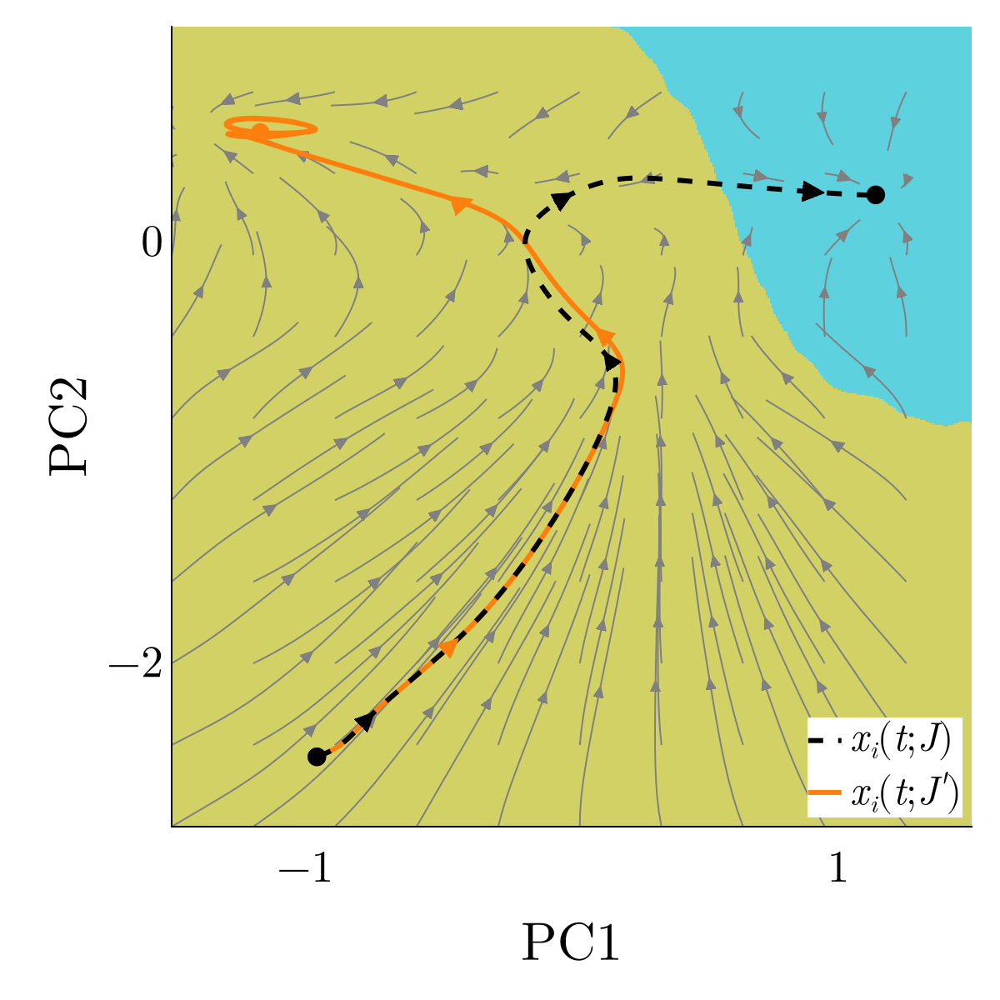

In [31]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", xticks=[-1, 1], yticks=[-2, 0],)
heatmap!(z1s_, z2s_, tab10[B_], alpha=0.7)
psols = [transform(pca, sol[:, :]) for sol in sols[1:5:end, 1:5:end]]
for psol in psols
    lines!(psol[1, 1:20], psol[2, 1:20], linewidth=1, color=:gray)
    arrow2!(psol[1:2, 10], psol[1:2, 11] - psol[1:2, 10], color=:gray, tiplength=10, tipwidth=10, lengthscale=0.05,)
end

genocopy = sol_individual(mutant_, x0, η, t)
pgenocopy = transform(pca, genocopy[:, :])
lines!(pgenocopy[1, :], pgenocopy[2, :], linewidth=3, color=tab10[2])
scatter!(pgenocopy[1, end], pgenocopy[2, end], markersize=16, color=tab10[2])
for ts in 10:60:200
    arrow2!(poriginal[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tiplength=10, tipwidth=10, lengthscale=0.08, color=:black)
end

lines!(poriginal[1, :], poriginal[2, :], linewidth=3, color=:black, linestyle=:dash)
scatter!(poriginal[1, 1], poriginal[2, 1], markersize=16, color=:black)
scatter!(poriginal[1, end], poriginal[2, end], markersize=16, color=:black)
for ts in 20:60:180
    arrow2!(pgenocopy[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tiplength=10, tipwidth=10, lengthscale=0.08, color=tab10[2])
end

xlims!(extrema(z1s)...), ylims!(extrema(z2s)...)
lines!([0], [0], linewidth=3, color=:black, linestyle=:dash, label=L"$x_i (t; J)$")
lines!([0], [0], linewidth=3, color=tab10[2], label=L"$x_i (t; J')$")
axislegend(position=:rb, labelsize=24, framevisible=true, framecolor=:white)
# save("fig6b.png", f)
f

In [33]:
sensitivity_evolution = load("data/sensitivity_evolution.jld2")
sensitivity_mcmc = load("data/sensitivity_mcmc.jld2")
t′_s = sensitivity_evolution["t′_s"]
t′_s = t′_s .+ step(t′_s) / 2
timestep = 20

20

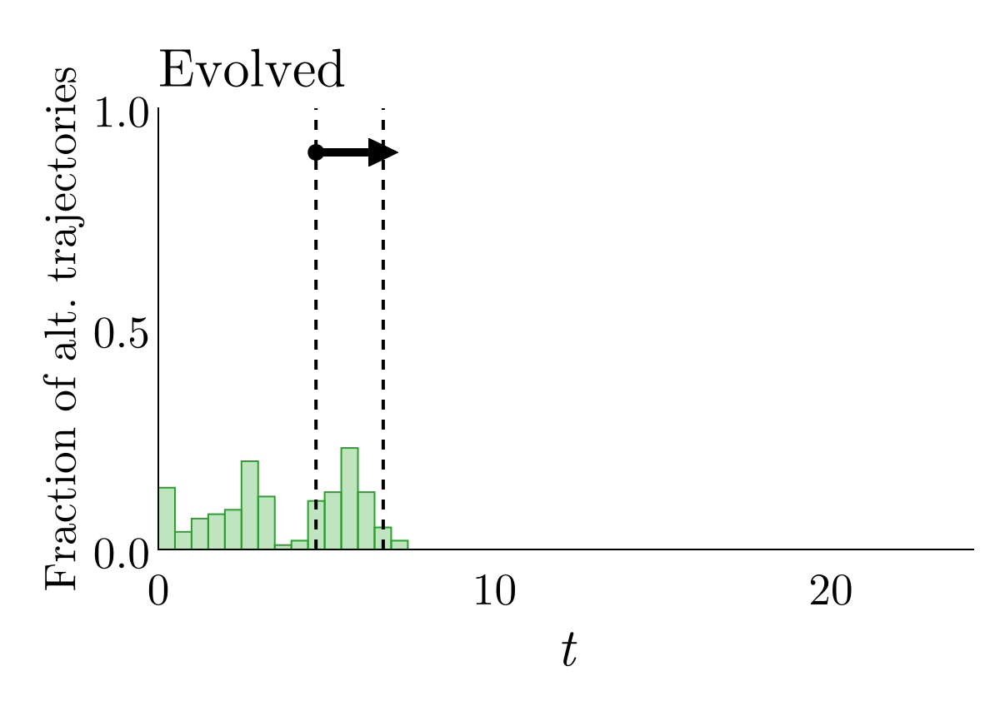

In [34]:
f, ax = plot(xlabel=L"$t$", ylabel="Fraction of alt. trajectories", xticks=[0, 10, 20], yticks=[0, 0.5, 1.], ylabelsize=2 * 10 * 4 / 3,
    title="Evolved", titlealign=:left, titlesize=4 / 3 * 12 * 2, titlefont=:regular)

seed = 1
barplot!(ax, t′_s, sensitivity_evolution["environment"][seed] / 100, gap=0, strokewidth=1, color=(tab10[3], 0.3), strokecolor=tab10[3], label="Evolved")
limits!(extrema(t)..., 0., 1.)

t′ = t′_s[argmax(sensitivity_evolution["environment"][seed])]
vlines!([t′ - 1, t′ + 1], color=:black, linestyle=:dash, linewidth=2)
scatter!([t′ - 1], [0.9], markersize=14, color=:black)
lines!([t′ - 1, t′ + 1], [0.9, 0.9], color=:black, linewidth=5)
arrow2!([t′ + 1, 0.9], [1, 0], tiplength=10, tipwidth=10, lengthscale=0.85, color=:black)

# save("fig6c.png", f)
f

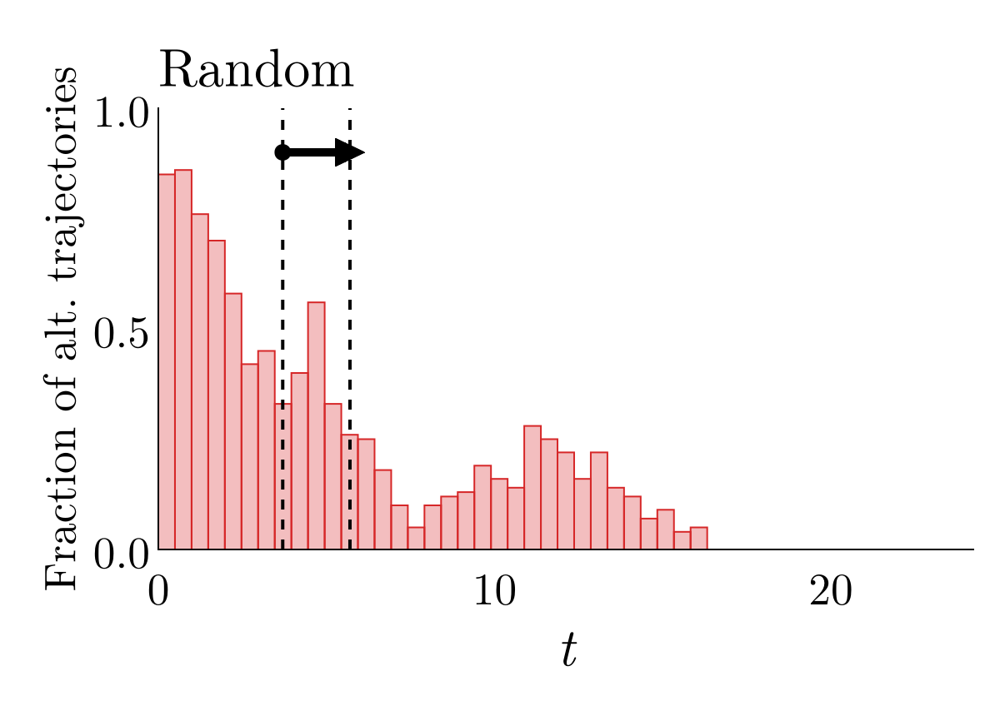

In [35]:
f, ax = plot(xlabel=L"$t$", ylabel="Fraction of alt. trajectories", xticks=[0, 10, 20], yticks=[0, 0.5, 1.], ylabelsize=2 * 10 * 4 / 3,
    title="Random", titlealign=:left, titlesize=4 / 3 * 12 * 2, titlefont=:regular)


seed = 10
barplot!(ax, t′_s, sensitivity_mcmc["environment"][seed] / 100, gap=0, strokewidth=1, color=(tab10[4], 0.3), strokecolor=tab10[4], label="Random")
limits!(extrema(t)..., 0., 1.)

t′ = t′_s[argmin(abs.(t′_s .- 4.9))]
vlines!([t′ - 1, t′ + 1], color=:black, linestyle=:dash, linewidth=2)
scatter!([t′ - 1], [0.9], markersize=14, color=:black)
lines!([t′ - 1, t′ + 1], [0.9, 0.9], color=:black, linewidth=5)
arrow2!([t′ + 1, 0.9], [1, 0], tiplength=10, tipwidth=10, lengthscale=0.85, color=:black)

# save("fig6d.png", f)
f

In [37]:
Random.seed!(1234)
seed = 1
t′ = t′_s[argmax(sensitivity_evolution["environment"][seed])]
individual = evolution[seed]

original = sol_individual(individual, x0, η, t)
phenocopies = environmental_copies(individual, t′, Δ, 100)
filter!(sol -> distance_t(original[1:M, :], sol[1:M, :]) .> 0.15, phenocopies)

timepoint = argmin(abs.(original.t .- t′))
X = original[1:N, timepoint-timestep:timepoint+timestep]
pca = fit(PCA, X)

attractors = Vector{Float64}[]
push!(attractors, original[:, end])
for (l, sol) in enumerate(phenocopies)
    if all([norm(sol[:, end] - a) > 1 for a in attractors])
        push!(attractors, sol[:, end])
    end
end

poriginal = transform(pca, original[1:N, timepoint-timestep:timepoint+timestep])
p0 = poriginal[:, timestep]
z1s = range(-0.5, 0.5, length=200)
z2s = range(-0.5, 0.5, length=200)
xs = [reconstruct(pca, [z1, z2, p0[3:end]...]) for z1 in z1s, z2 in z2s]

basins = zeros(Int, size(xs))
Threads.@threads for l in 1:length(xs)
    sol = sol_individual(individual, xs[l], η, t)
    basins[l] = argmin([norm(a - sol[:, end]) for a in attractors])
end

B = map(basin -> 10 - basin + 1, basins)
Δs = zeros(size(xs))
for l in 1:length(xs)
    Δs[l] = norm(original[:, timepoint-1] - xs[l])
end

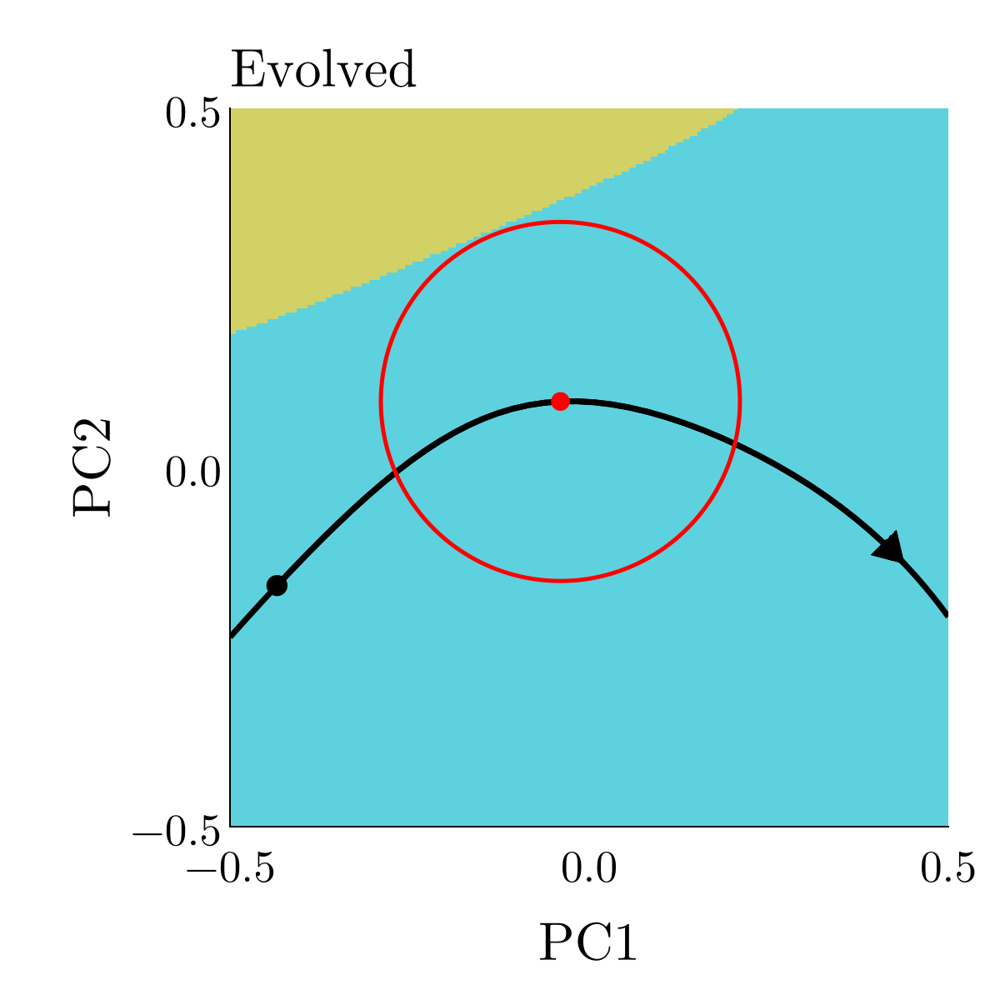

In [38]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", title="Evolved", titlefont=:regular, titlealign=:left, titlesize=4 / 3 * 12 * 2)

heatmap!(z1s, z2s, tab10[B], alpha=0.7)

poriginal = transform(pca, original[1:N, timepoint-timestep-20:timepoint+timestep+20])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3.5, color=:black)
poriginal = transform(pca, original[1:N, timepoint-timestep:timepoint+timestep])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3.5, color=:black)
scatter!([poriginal[1, 1]], [poriginal[2, 1]], color=:black, markersize=18)
arrow2!(poriginal[:, end-1], poriginal[:, end] - poriginal[:, end-1], tipwidth=10, lengthscale=0.04, color=:black)

scatter!([p0[1]], [p0[2]], color=:red, markersize=16)
contour!(z1s, z2s, Δs, levels=[Δ], color=:red, linewidth=2.5)

xlims!(extrema(z1s)...)
ylims!(extrema(z2s)...)
# save("fig6e.png", f)
f

In [40]:
function environmental_copy(individual, t′, Δ, t_)
    sol_individual(individual, x0, η, t_, callback=callback_perturbation(t′, Δ))
end

function environmental_copies(individual, t′, Δ, L′, t_)
    copies = Vector{ODESolution}(undef, L′)
    Threads.@threads for l in 1:L′
        copies[l] = environmental_copy(individual, t′, Δ, t_)
    end
    copies
end

environmental_copies (generic function with 2 methods)

In [41]:
seed = 10
t′ = t′_s[argmin(abs.(t′_s .- 4.9))]
individual = mcmc[seed]

Individual([1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [0.0 1.0 … 0.0 1.0; -1.0 -1.0 … 1.0 -1.0; … ; 1.0 0.0 … 1.0 0.0; 0.0 0.0 … -1.0 0.0], -0.03748560301760116)

In [42]:
original = sol_individual(individual, x0, η, t)
phenocopies = environmental_copies(individual, t′, Δ, 100, (0., 60.))
filter!(sol -> distance_t(original[1:M, :], sol[1:M, 1:length(original.t)]) .> 0.15, phenocopies)
D = pairwise(Euclidean(), [sol[:, end] for sol in phenocopies])
h = hclust(D)
ho = h.order
ls = cutree(h, k=4)

phenocopies = phenocopies[ho]
ls = ls[ho]

40-element Vector{Int64}:
 1
 ⋮
 4

In [43]:
attractors = Vector{Vector{Float64}}(undef, 4)
for k in 1:4
    attractors[k] = phenocopies[findfirst(ls .== k)][:, end]
end
timepoint = argmin(abs.(original.t .- t′))
X = original[1:N, timepoint-timestep:timepoint+timestep]
pca = fit(PCA, X)
poriginal = transform(pca, original[1:N, timepoint-timestep:timepoint+timestep])
p0 = poriginal[:, timestep]
z1s = range(-0.85, 0.85, length=200)
z2s = range(-0.85, 0.85, length=200)
xs = [reconstruct(pca, [z1, z2, p0[3:end]...]) for z1 in z1s, z2 in z2s]
basins = zeros(Int, size(xs))
Threads.@threads for l in 1:length(xs)
    sol = sol_individual(individual, xs[l], η, t)
    basins[l] = argmin([norm(a - sol[:, end]) for a in attractors])
end

B = zeros(Int, size(basins))
for l in 1:length(basins)
    if basins[l] == 3
        B[l] = 6
    elseif basins[l] == 1
        B[l] = 10
    elseif basins[l] == 2
        B[l] = 7
    else
        B[l] = 5
    end
end
Δs = zeros(size(xs))
for l in 1:length(xs)
    Δs[l] = norm(original[:, timepoint-1] - xs[l])
end

In [44]:
# tab10[[7, 10, 6, 5]]

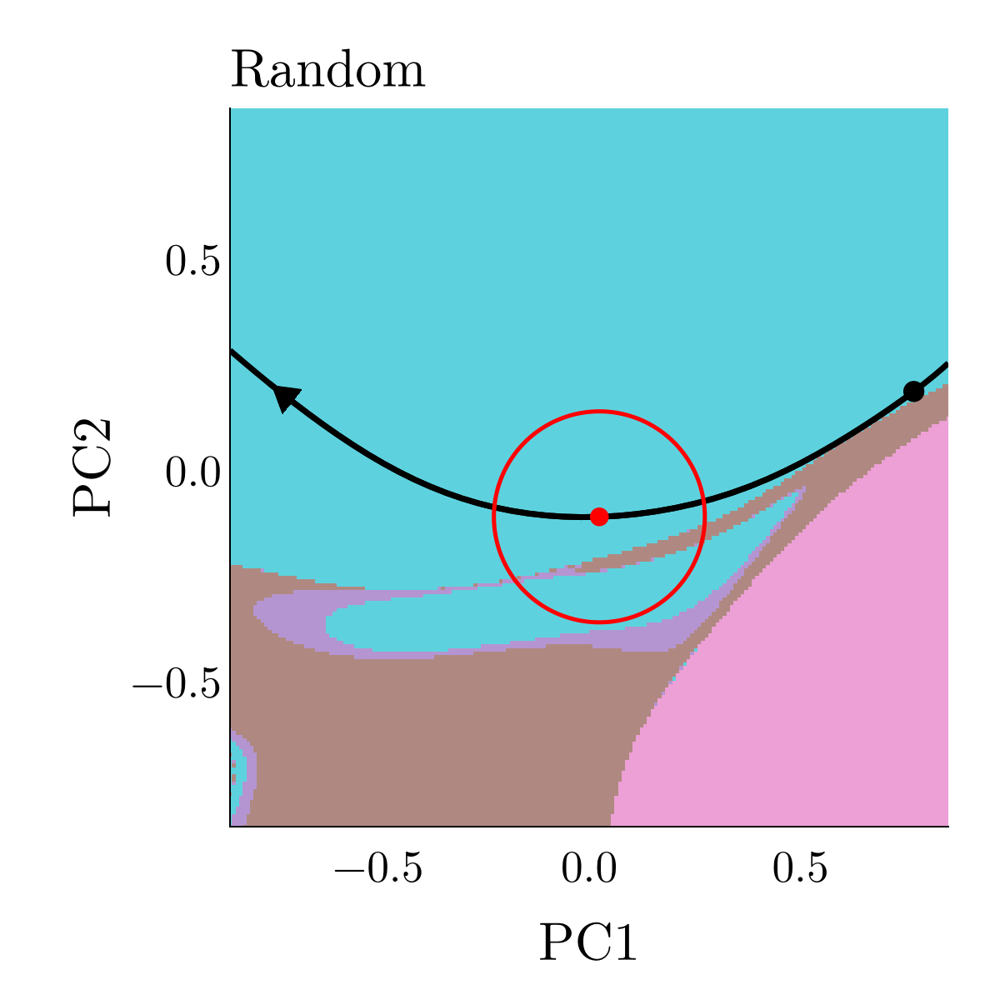

In [45]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", title="Random", titlefont=:regular, titlealign=:left, titlesize=4 / 3 * 12 * 2)

heatmap!(z1s, z2s, tab10[B], alpha=0.7)

poriginal = transform(pca, original[1:N, timepoint-timestep-20:timepoint+timestep+20])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3.5, color=:black)
poriginal = transform(pca, original[1:N, timepoint-timestep:timepoint+timestep])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3.5, color=:black)
scatter!([poriginal[1, 1]], [poriginal[2, 1]], color=:black, markersize=18)
arrow2!(poriginal[:, end-1], poriginal[:, end] - poriginal[:, end-1], tipwidth=10, lengthscale=0.06, color=:black)

scatter!([p0[1]], [p0[2]], color=:red, markersize=16)
contour!(z1s, z2s, Δs, levels=[Δ], color=:red, linewidth=2.5)

xlims!(extrema(z1s)...)
ylims!(extrema(z2s)...)
# save("fig6f.png", f)
f

In [48]:

seed = 1
individual = evolution[seed]

Random.seed!(1234)
original = sol_individual(individual, x0, η, t)
phenocopies = reduce(vcat, [environmental_copies(individual, t′, Δ, 100) for t′ in range(extrema(t)..., length=50)])
filter!(sol -> distance_t(original[1:M, :], sol[1:M, :]) .> 0.15, phenocopies)
D = pairwise(distance_t, vec([sol[:, :] for sol in phenocopies]))
h = hclust(D)
ho = h.order

ls = cutree(h, k=3)
ls = ls[ho]

phenocopies = phenocopies[ho]

k = 3
X = reduce(hcat, [original[:, :], phenocopies[findfirst(ls .== k)][:, :]])
pca = fit(PCA, X)

PCA(indim = 40, outdim = 8, principalratio = 0.992682186362127)

Pattern matrix (unstandardized loadings):
───────────────────────────────────────────────────────────────────────────────────────────────────────────────
            PC1           PC2           PC3          PC4          PC5           PC6           PC7           PC8
───────────────────────────────────────────────────────────────────────────────────────────────────────────────
1    0.221652     0.079104     -0.249413      0.127227     0.0461809   -0.0187514     0.00811152    0.0107197
2    0.0168066    0.0814247     0.0232452     0.0323495   -0.0130674   -0.00758766    0.00310499    0.0008425
3    0.0253079    0.280938     -0.0788939    -0.167558    -0.0142921   -0.017005     -0.0410883     0.0231924
4    0.00170013   0.0733731     0.0252174     0.0319291   -0.0131672   -0.00972451    0.00778729    0.00253182
5    0.0338761    0.0971279     0.0350782     0.0354756   -0.0180082   -0.0112336     0.0136577     0.00860796
6    

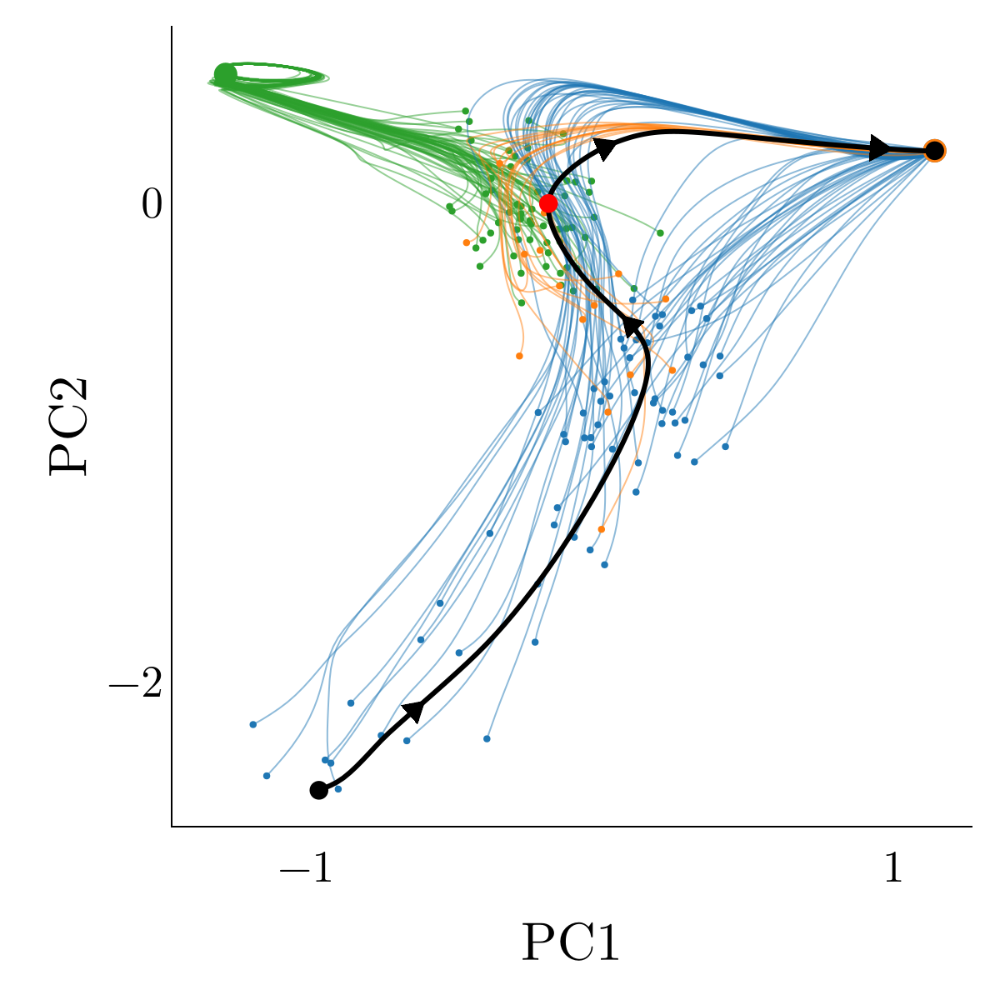

In [49]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", xticks=[-1, 1], yticks=[-2, 0])

for (l, sol) in zip(ls, phenocopies)
    timepoint = findfirst([norm(d) for d in eachcol(original[:, :] - sol[:, :])] .> 10^(-3))
    psol = transform(pca, sol[:, :])
    scatter!(psol[1, timepoint], psol[2, timepoint], color=tab10[l], markersize=6)
    lines!(psol[1, timepoint:end], psol[2, timepoint:end], linewidth=1, color=tab10[l], alpha=0.5)
end

for k in 1:3
    sol = phenocopies[findfirst(ls .== k)]
    psol = transform(pca, sol[:, :])
    scatter!(psol[1, end], psol[2, end], color=tab10[k], markersize=20)
end
poriginal = transform(pca, original[:, :])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3, color=:black)
scatter!(poriginal[1, 1], poriginal[2, 1], markersize=16, color=:black)
scatter!(poriginal[1, end], poriginal[2, end], markersize=16, color=:black)

for ts in 15:60:200
    arrow2!(poriginal[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tipwidth=10, lengthscale=0.075, color=:black)
end
scatter!(poriginal[1, timepoint], poriginal[2, timepoint], markersize=16, color=:red)

# save("figs3a.pdf", f)
f

In [51]:
seed = 10
individual = mcmc[seed]

original = sol_individual(individual, x0, η, t)
phenocopies = reduce(vcat, [environmental_copies(individual, t′, Δ, 50, (0., 70.)) for t′ in range(extrema(t)..., length=50)])
filter!(sol -> distance_t(original[1:M, 1:length(t̂)], sol[1:M, 1:length(t̂)]) .> 0.15, phenocopies)

D = pairwise(distance_t, vec([sol[:, :] for sol in phenocopies]))
h = hclust(D)
ho = h.order
ls = cutree(h, k=4)
ls = ls[ho]

phenocopies = phenocopies[ho]

484-element Vector{ODESolution}:
 ODESolution{Float64, 2, Vector{Vector{Float64}}, Nothing, Nothing, Vector{Float64}, Vector{Vector{Vector{Float64}}}, Nothing, ODEProblem{Vector{Float64}, Tuple{Float64, Float64}, true, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, ODEFunction{true, SciMLBase.AutoSpecialize, FunctionWrappersWrappers.FunctionWrappersWrapper{Tuple{FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{Float64}, Vector{Float64}, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Tuple{Vector{Float64}, Matrix{Float64}, Vector{Float64}}, Float64}}, FunctionWrappers.FunctionWrapper{Nothing, Tuple{Vector{ForwardDiff.Dual{ForwardDiff.Tag{DiffEqBase.OrdinaryDiffEqTag, Float64}, Float64, 1}}, Vector{Float64}, Tuple{Vec

In [52]:
k = 1
X = reduce(hcat, [original[:, :], phenocopies[findfirst(ls .== k)][:, :]])
pca = fit(PCA, X)

PCA(indim = 40, outdim = 11, principalratio = 0.9914455699226699)

Pattern matrix (unstandardized loadings):
──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
             PC1          PC2           PC3           PC4           PC5           PC6          PC7           PC8           PC9          PC10          PC11
──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
1   -0.339986     -0.01903      0.0202813     0.0521979    -0.0942004     0.107435     -0.0492464    0.0294634    -0.00889507    0.00847405    0.00619322
2    0.0139898     0.0281153   -0.0656674     0.00125344    0.0201322     0.0476708     0.036772     0.00539456   -0.000236131   0.00162483   -0.00601543
3   -0.354766      0.0125744   -0.121081     -0.06276      -0.0297693    -0.0608988     0.00950373  -0.00402237   -0.0

In [53]:
tab10_ = tab10[[1, 2, 3, 5]]

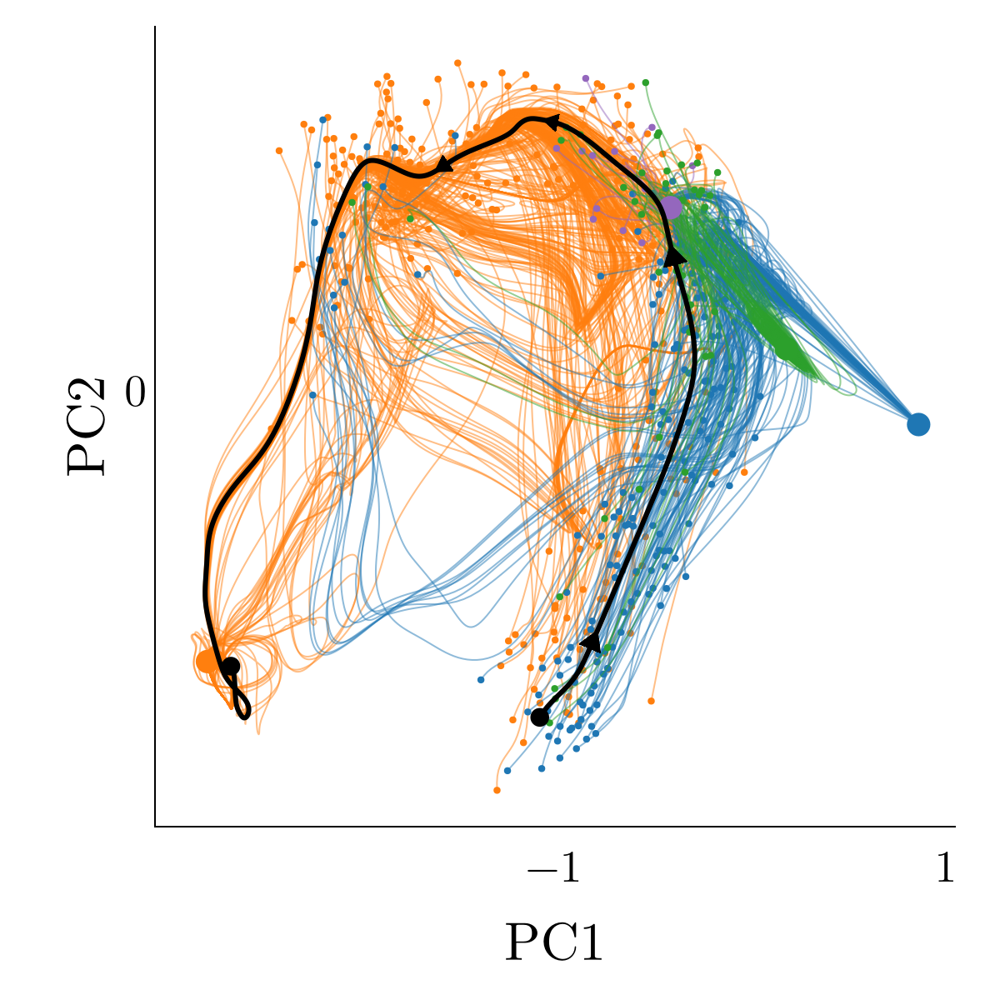

In [54]:
f, ax = plot(aspect=:equal,
    xlabel="PC1", ylabel="PC2", xticks=[-1, 1], yticks=[-2, 0])

for (l, sol) in zip(ls, phenocopies)
    timepoint = findfirst([norm(d) for d in eachcol(original[1:N, 1:length(original.t)] - sol[1:N, 1:length(original.t)])] .> 10^(-3))
    psol = transform(pca, sol[:, :])
    scatter!(psol[1, timepoint], psol[2, timepoint], color=tab10_[l], markersize=6)
    lines!(psol[1, timepoint:end], psol[2, timepoint:end], linewidth=1, color=tab10_[l], alpha=0.5)
end

for k in 1:4
    sol = phenocopies[findfirst(ls .== k)]
    psol = transform(pca, sol[:, :])
    scatter!(psol[1, end], psol[2, end], color=tab10_[k], markersize=20)
end
poriginal = transform(pca, original[:, :])
lines!(poriginal[1, :], poriginal[2, :], linewidth=3, color=:black)
scatter!(poriginal[1, 1], poriginal[2, 1], markersize=16, color=:black)
scatter!(poriginal[1, end], poriginal[2, end], markersize=16, color=:black)

for ts in 15:60:200
    arrow2!(poriginal[:, ts], poriginal[:, ts+1] - poriginal[:, ts], tipwidth=10, lengthscale=0.075, color=:black)
end

# save("figs3b.pdf", f)
f